In [1]:
# ... 상품 이미지에서 표를 추출하는 모델 ...

# ... 전처리 인공지능모델 후처리 순으로 진행 ...

# 전처리 : 상품이미지를 크롭하여, "표"라고 생각되는 부분만을 인공지능모델에게 전달
# 이미지를 우선 제거하는 과정

# 인공지능모델 : 전처리과정을 거친 크롭된 이미지를 받아, 학습시킨 모델로 이미지에서 "표"를 찾아 나타내준다.
# 인공지능모델에서는 boundingbox의 좌표값을 출력해 준다.

# 후처리 : 상품이미지에서 boundingbox의 좌표값을 받아 "표"의 위치에 마스킹을 해준다.

In [2]:
%cd /content/drive/My Drive/Coding/detectron2

import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

/content/drive/My Drive/Coding/detectron2


In [3]:
# detectron2 original 깃허브repo clone
%cd /content/drive/MyDrive/Coding/detectron2
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

/content/drive/MyDrive/Coding/detectron2
fatal: destination path 'detectron2_repo' already exists and is not an empty directory.
Obtaining file:///content/drive/MyDrive/Coding/detectron2/detectron2_repo
  Attempting uninstall: detectron2
    Found existing installation: detectron2 0.5
    Can't uninstall 'detectron2'. No files were found to uninstall.
  Running setup.py develop for detectron2


In [4]:
#런타임 재실행

In [5]:
#라이브러리 import
%cd /content/drive/MyDrive/Coding/detectron2
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import detectron2 utilities
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

/content/drive/MyDrive/Coding/detectron2


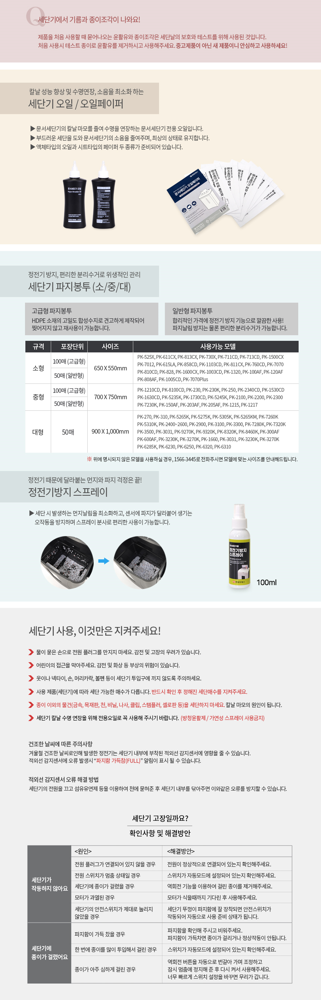

In [6]:
#원본 상품 이미지 불러오기
img_basic = cv2.imread('testimage.png', cv2.IMREAD_COLOR)
image_final = img_basic.copy()
cv2_imshow(img_basic)

**1. 이미지 전처리**

In [44]:
#흑백 이미지로 변환
image = cv2.cvtColor(img_basic, cv2.COLOR_BGR2GRAY)

#임계점 처리1 - adaptive threshold
thresh = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 15, 2)

#임계점 색반전
reverse_basic = 255 - thresh.copy()

In [45]:
y_axis = np.zeros([1,reverse_basic.shape[0]])
for i in range (0,reverse_basic.shape[0]):
  for j in range (0,reverse_basic.shape[1]):
    if(reverse_basic[i,j] >= 20):
      y_axis[0,i] += 1
reverse_empty = reverse_basic
empty_cnt = 0
empty_cnt_list = []
for i in range(0,reverse_basic.shape[0]):
  if (y_axis[0,i] == 0):
    empty_cnt += 1
    empty_cnt_list.append(i)
  else:
    if(empty_cnt > 0):
      if(empty_cnt>=reverse_basic.shape[0]*0.025):
        print(empty_cnt_list[(int((len(empty_cnt_list)/2)))])
        reverse_empty[empty_cnt_list[(int((len(empty_cnt_list)/2)))],:] = 255
        
    empty_cnt = 0
    empty_cnt_list = []

In [46]:
#가로선, 세로선만 인식하여 남기는 작업
line_min_width = int(reverse_empty.shape[1]*0.1)
kernal_h = np.ones((1,line_min_width),np.uint8)
kernal_v = np.ones((line_min_width,1),np.uint8)

img_bin_h = cv2.morphologyEx(reverse_empty, cv2.MORPH_OPEN, kernal_h)
img_bin_v = cv2.morphologyEx(reverse_empty, cv2.MORPH_OPEN, kernal_v)

reverse=img_bin_h|img_bin_v

In [47]:
#가로선 인식을 위한 그래프 작성
y_axis = np.zeros([1,reverse.shape[0]])
for i in range (0,reverse.shape[0]):
  for j in range (0,reverse.shape[1]):
    if(reverse[i,j] >= 20):
      y_axis[0,i] += 1

In [48]:
cnt = 0
cnt_cut = 0
full = np.zeros([1,reverse.shape[0]])
full[0,0]=reverse.shape[1]
for i in range(0,reverse.shape[0]):
  if(y_axis[0,i]==reverse.shape[1]):
    if(y_axis[0,i-1]!=reverse.shape[1]):
      full[0,i] = reverse.shape[1]
      cnt += 1
cnt+=2
cut = np.zeros([1,cnt])
for i in range(0,reverse.shape[0]):
  if(full[0,i]==reverse.shape[1]):
    cut[0,cnt_cut] = i
    cnt_cut += 1
cut[0,-1] = reverse.shape[0]
print(cut)

[[   0.  160.  186.  647.  671. 1602. 1625. 2673.]]


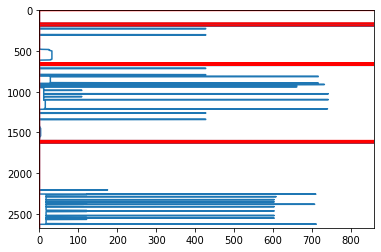

In [49]:
x = y_axis
y = np.array([range(0,reverse.shape[0])])
plt.xlim([0,reverse.shape[1]])
plt.ylim([reverse.shape[0],0])
plt.plot(x[0,:],y[0,:])

x = full
y = np.array([range(0,reverse.shape[0])])
plt.xlim([0,reverse.shape[1]])
plt.ylim([reverse.shape[0],0])
plt.plot(x[0,:],y[0,:],'r')
plt.show()

In [50]:
crops = []
y_axis_ = []
for i in range(0,cnt-1):
  crop_i = reverse[int(cut[0,i]):int(cut[0,i+1])]
  crops.append(crop_i)

  #각 crop 이미지별 가로선 인식 그래프 작성
  y_axis = np.zeros([1,crop_i.shape[0]])
  for i in range (0,crop_i.shape[0]):
    for j in range (0,crop_i.shape[1]):
      if(crop_i[i,j] >= 20):
        y_axis[0,i] += 1

  y_axis_.append(y_axis)

---------------------------------------------------------
crop[ 0 ]


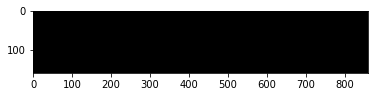

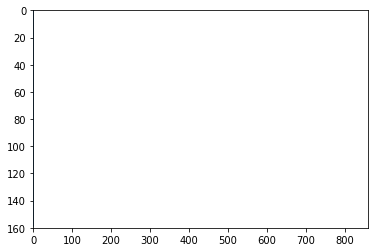

[]
---------------------------------------------------------
crop[ 1 ]


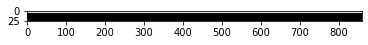

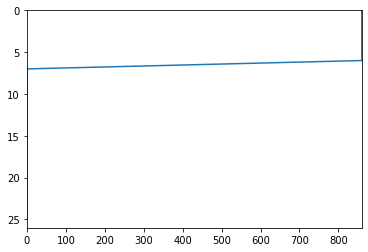

[0]
0 0 860.0 1
---------------------------------------------------------
crop[ 2 ]


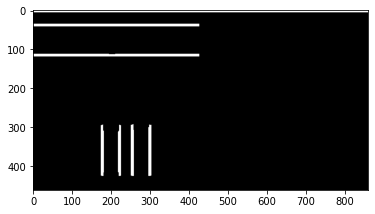

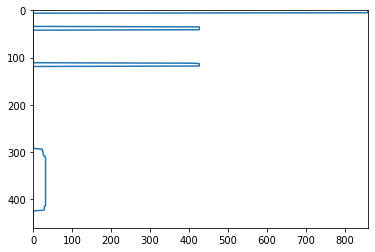

[0, 35, 113, 300, 312]
0 0 860.0 1
1 35 427.0 2
2 113 427.0 2
3 300 26.0 1
4 312 32.0 1
---------------------------------------------------------
crop[ 3 ]


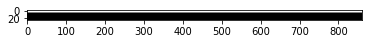

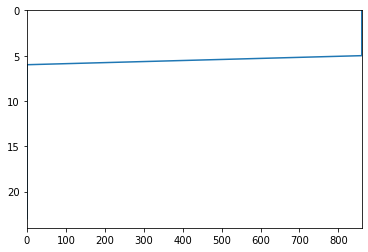

[0]
0 0 860.0 1
---------------------------------------------------------
crop[ 4 ]


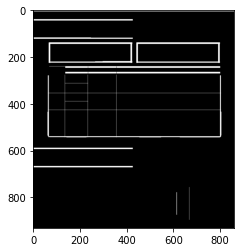

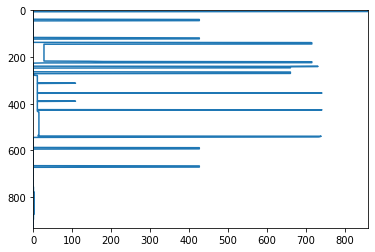

[0, 39, 118, 139, 220, 240, 264, 279, 312, 354, 389, 426, 435, 539, 588, 666, 756, 778]
0 0 860.0 1
1 39 427.0 4
2 118 427.0 4
3 139 716.0 2
4 220 716.0 2
5 240 732.0 1
6 264 661.0 1
7 279 11.0 1
8 312 109.0 2
9 354 742.0 2
10 389 109.0 2
11 426 742.0 2
12 435 15.0 1
13 539 740.0 1
14 588 427.0 4
15 666 427.0 4
16 756 1.0 1
17 778 3.0 1
---------------------------------------------------------
crop[ 5 ]


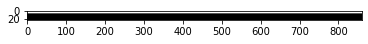

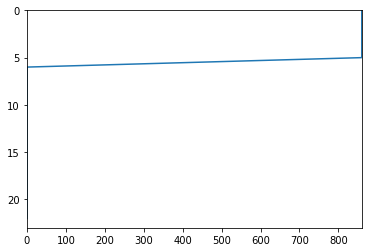

[0]
0 0 860.0 1
---------------------------------------------------------
crop[ 6 ]


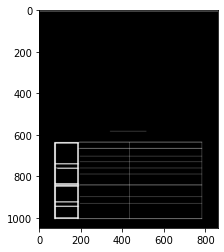

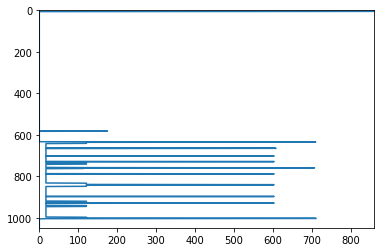

[0, 582, 635, 665, 702, 729, 737, 759, 788, 833, 840, 897, 920, 929, 941, 1003]
0 0 860.0 1
1 582 175.0 1
2 635 710.0 1
3 665 608.0 1
4 702 603.0 6
5 729 603.0 6
6 737 121.0 4
7 759 707.0 1
8 788 603.0 6
9 833 121.0 4
10 840 603.0 6
11 897 603.0 6
12 920 121.0 4
13 929 603.0 6
14 941 121.0 4
15 1003 711.0 1


In [51]:
crop_num = 0
table_list = []

for crop_num in range(0,cnt-1):
  print('---------------------------------------------------------')
  print('crop[',crop_num,']')

  plt.imshow(cv2.cvtColor(crops[crop_num], cv2.COLOR_BGR2RGB))
  plt.show()

  x = y_axis_[crop_num]
  y = np.array([range(0,crops[crop_num].shape[0])])
  plt.xlim([0,crops[crop_num].shape[1]])
  plt.ylim([crops[crop_num].shape[0],0])
  plt.plot(x[0,:],y[0,:])
  plt.show() 
  peak_test = []
  peak_value_test = list(y_axis_[crop_num][0])
  for i in range(0,crops[crop_num].shape[0]-4):
    if(y_axis_[crop_num][0][i])>y_axis_[crop_num][0][i-5]:
      if(y_axis_[crop_num][0][i])>y_axis_[crop_num][0][i-4]:
        if(y_axis_[crop_num][0][i])>y_axis_[crop_num][0][i-3]:
          if(y_axis_[crop_num][0][i])>y_axis_[crop_num][0][i-2]:
            if(y_axis_[crop_num][0][i])>y_axis_[crop_num][0][i-1]:
              if(y_axis_[crop_num][0][i])>=y_axis_[crop_num][0][i+1]:
                if(y_axis_[crop_num][0][i])>=y_axis_[crop_num][0][i+2]:
                  if(y_axis_[crop_num][0][i])>=y_axis_[crop_num][0][i+3]:
                    if(y_axis_[crop_num][0][i])>=y_axis_[crop_num][0][i+4]:
                      if(y_axis_[crop_num][0][i])>=y_axis_[crop_num][0][i+5]:
                        peak_test.append(i)
  print(peak_test)
  peak_value_test_2 = []
  for i in range(0,len(peak_test)):
    peak_value_test_2.append(y_axis_[crop_num][0][peak_test[i]])


  table_flag=0
  
  for i in range(0,len(peak_test)):
    print(i,peak_test[i],y_axis_[crop_num][0][peak_test[i]],peak_value_test_2.count(peak_value_test_2[i]))
    if(peak_value_test_2.count(peak_value_test_2[i])>=3):
      table_flag=1
  table_list.append(table_flag)


---------------------------------------------------------


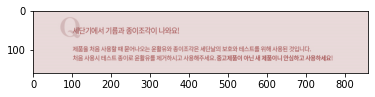

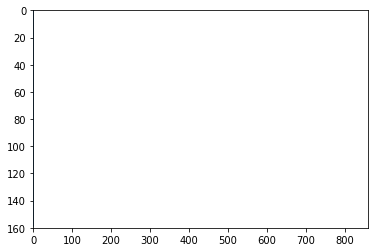

crop[ 0 ]  표 없는것으로 추정
---------------------------------------------------------


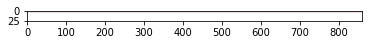

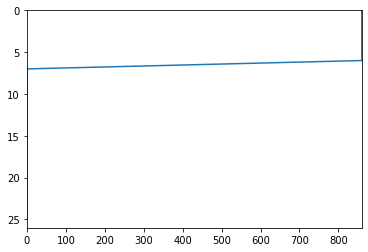

crop[ 1 ]  표 없는것으로 추정
---------------------------------------------------------


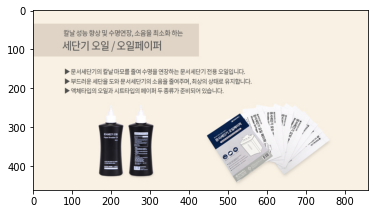

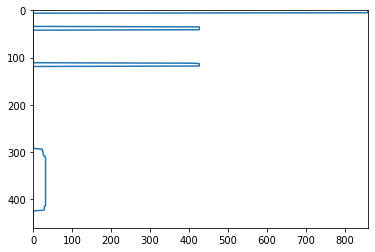

crop[ 2 ]  표 없는것으로 추정
---------------------------------------------------------


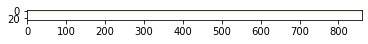

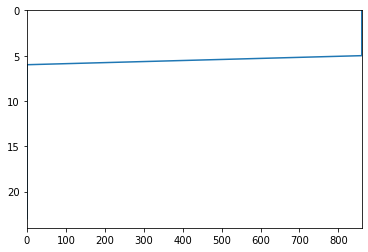

crop[ 3 ]  표 없는것으로 추정
---------------------------------------------------------


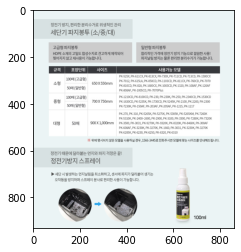

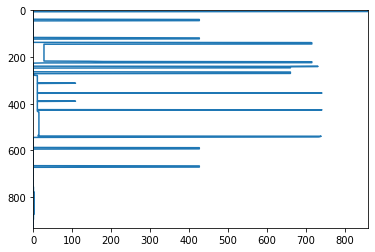

crop[ 4 ]  표 있는것으로 추정, 인공지능 모델에 넘겨줌
좌표(x,y) : ( 0, 671 ) ~ ( 860 , 1602 )
---------------------------------------------------------


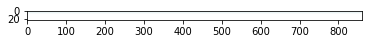

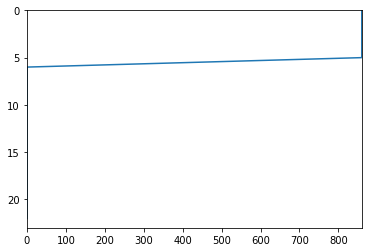

crop[ 5 ]  표 없는것으로 추정
---------------------------------------------------------


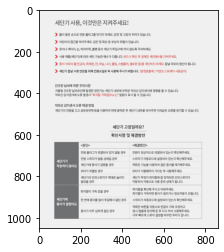

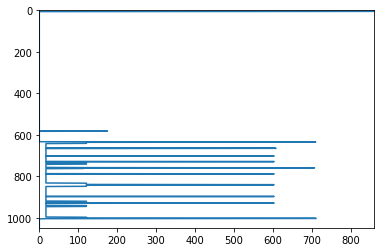

crop[ 6 ]  표 있는것으로 추정, 인공지능 모델에 넘겨줌
좌표(x,y) : ( 0, 1625 ) ~ ( 860 , 2673 )


In [52]:
original_num = []
for i in range(0,cnt-1):
  print('---------------------------------------------------------')
  plt.imshow(cv2.cvtColor(img_basic[int(cut[0,i]):int(cut[0,i+1])], cv2.COLOR_BGR2RGB))
  plt.show()
  #가로선 인식 그래프 plot
  x = y_axis_[i]
  y = np.array([range(0,crops[i].shape[0])])
  plt.xlim([0,crops[i].shape[1]])
  plt.ylim([crops[i].shape[0],0])
  plt.plot(x[0,:],y[0,:])
  plt.show()  
  
  if(table_list[i]==1):
    print('crop[',i,']',' 표 있는것으로 추정, 인공지능 모델에 넘겨줌')
    print('좌표(x,y) : ( 0,',int(cut[0,i]),') ~ (',crops[i].shape[1],',',int(cut[0,i+1]),')')
    original_num.append(i)
  else :
    print('crop[',i,']',' 표 없는것으로 추정')

-> crop[ 4 ]


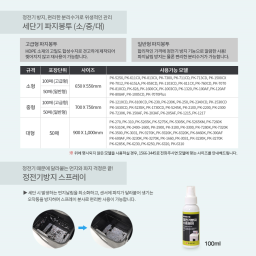

upper : 671 , lower : 1602
size : 256 x 256
-> crop[ 6 ]


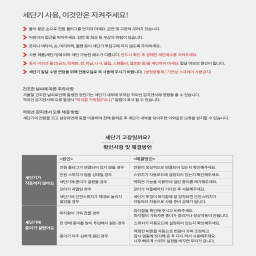

upper : 1625 , lower : 2673
size : 256 x 256
[0, 0, 0, 0, 1, 0, 1]
2
[931, 1048]


In [53]:
send = []
y_size = []
y_start = []
for i in range(0,cnt-1):
  if(table_list[i]==1):
    print('-> crop[',i,']')
    shrink_before = img_basic[int(cut[0,i]):int(cut[0,i+1])]
    shrink=cv2.resize(shrink_before, None, fx=256/crops[i].shape[1], fy=256/crops[i].shape[0], interpolation=cv2.INTER_AREA)
    send.append(shrink)
    cv2_imshow(shrink)
    print('upper :',int(cut[0,i]),', lower :',int(cut[0,i+1]))
    print('size :',shrink.shape[1],'x',shrink.shape[0])
    y_size.append(int(cut[0,i+1])-int(cut[0,i]))
    y_start.append(int(cut[0,i]))

img_num = 0
print(table_list)
print(len(send))
print(y_size)

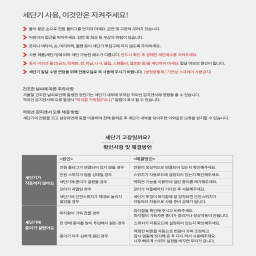

In [73]:
if(img_num<len(send)):
  cv2.imwrite("image.png",send[img_num])
  img_num += 1
  img_table_test = cv2.imread('image.png', cv2.IMREAD_COLOR)
  cv2_imshow(img_table_test)
else:
  print("전송할 이미지 없음")

**2. 인공지능모델**

In [55]:
#토치비전 설치
!pip install -U torch torchvision
!pip install git+https://github.com/facebookresearch/fvcore.git
import torch, torchvision
torch.__version__

  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-qn_ylhe4
  Running command git clone -q https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-qn_ylhe4
  Created wheel for fvcore: filename=fvcore-0.1.5-py3-none-any.whl size=64542 sha256=189048151763a4e33b5d9a1b4ebd9ebf2d7e47547737bb3ebcab6e5cdb18861f
  Stored in directory: /tmp/pip-ephem-wheel-cache-43dbn0_g/wheels/24/1d/09/8167de727fe5b74f832b6fcb5d9069d8f03ca29f337bfe484d
Successfully built fvcore
  Attempting uninstall: fvcore
    Found existing installation: fvcore 0.1.5.post20210825
    Uninstalling fvcore-0.1.5.post20210825:
      Successfully uninstalled fvcore-0.1.5.post20210825


'1.9.0+cu102'

In [56]:
#table 객체 추가 // coco 데이터셋에 표 객체instance를 추가해준다.
from detectron2.data.datasets import register_coco_instances
register_coco_instances("table", {}, "./data/trainval.json", "./data/images")
table_metadata = MetadataCatalog.get("table")
dataset_dicts = DatasetCatalog.get("table")

WARNING [08/31 13:59:55 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/31 13:59:55 d2.data.datasets.coco]: Loaded 86 images in COCO format from ./data/trainval.json


In [60]:
#학습 시작, 완료되면 detectron2/output 폴더에 모델가중치 저장
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os
from PIL import ImageFile 
ImageFile.LOAD_TRUNCATED_IMAGES = True 
from PIL import Image

cfg = get_cfg()
cfg.merge_from_file("./detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.DATASETS.TRAIN = ("table",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"  # model zoo 초기화
cfg.SOLVER.IMS_PER_BATCH = 2   #한 번 배치할 때 사용할 이미지
cfg.SOLVER.BASE_LR = 0.01    # pick a good LR (total_loss 0.43)
cfg.SOLVER.MAX_ITER = 500    # pick a good epoch 560 (total_loss 0.43)
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # 1 classes (table)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[08/31 14:18:23 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

[08/31 14:18:23 d2.engine.train_loop]: Starting training from iteration 0
[08/31 14:18:48 d2.utils.events]:  eta: 0:08:23  iter: 19  total_loss: 1.871  loss_cls: 0.5707  loss_box_reg: 0.2222  loss_mask: 0.6306  loss_rpn_cls: 0.2197  loss_rpn_loc: 0.0509  time: 1.1176  data_time: 0.7047  lr: 0.00038962  max_mem: 2829M
[08/31 14:19:09 d2.utils.events]:  eta: 0:07:49  iter: 39  total_loss: 1.359  loss_cls: 0.3825  loss_box_reg: 0.4504  loss_mask: 0.3881  loss_rpn_cls: 0.1345  loss_rpn_loc: 0.0298  time: 1.0633  data_time: 0.3614  lr: 0.00078922  max_mem: 2829M
[08/31 14:19:31 d2.utils.events]:  eta: 0:07:39  iter: 59  total_loss: 1.368  loss_cls: 0.3649  loss_box_reg: 0.5258  loss_mask: 0.3558  loss_rpn_cls: 0.1082  loss_rpn_loc: 0.03759  time: 1.0862  data_time: 0.3733  lr: 0.0011888  max_mem: 2829M
[08/31 14:19:53 d2.utils.events]:  eta: 0:06:40  iter: 79  total_loss: 1.336  loss_cls: 0.3188  loss_box_reg: 0.5027  loss_mask: 0.2999  loss_rpn_cls: 0.07732  loss_rpn_loc: 0.04932  time: 1.

In [65]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

Output hidden; open in https://colab.research.google.com to view.

In [75]:
cfg.MODEL.WEIGHTS = "/content/drive/MyDrive/Coding/detectron2/output/model_final.pth" #모델가중치가 저장된 경로
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.75    # 인식률 75%미만 표시x
cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.1   # bbox겹침 조절
cfg.DATASETS.TEST = ("table", )
predictor = DefaultPredictor(cfg)

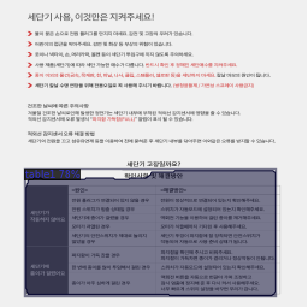

In [76]:
path = "/content/drive/MyDrive/Coding/detectron2/image.png"         # 대상 이미지

im = cv2.imread(path)
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

In [77]:
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

outputs["instances"].pred_boxes	#boundingbox 좌표 표시

Boxes(tensor([[ 20.9202, 141.3820, 230.3445, 247.2294]], device='cuda:0'))

**3. 후처리**

In [78]:
#좌표값은 수기로 작성해줘야 함

box_write = [[20.9202, 141.3820, 230.3445, 247.2294]]

box = np.array(box_write)

In [79]:
shrink_after=cv2.resize(send[img_num-1], None, fx=img_basic.shape[1]/256, fy=y_size[img_num-1]/256, interpolation=cv2.INTER_AREA)
print(crops[original_num[img_num-1]].shape)
print(shrink_after.shape)

(1048, 860)
(1048, 860, 3)


[[  70.27879687  578.7825625   773.81355469 1012.09535625]]
box 0
2203
2637
70
773


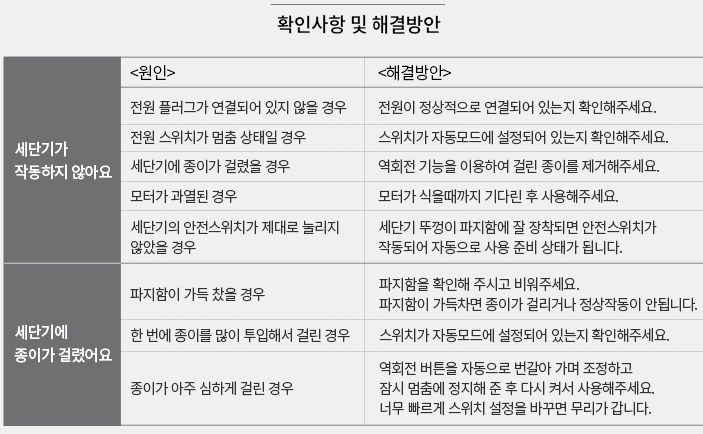

In [80]:
boxes = box
boxes[:,0] = box[:,0]*crops[original_num[img_num-1]].shape[1]/256
boxes[:,1] = box[:,1]*crops[original_num[img_num-1]].shape[0]/256
boxes[:,2] = box[:,2]*crops[original_num[img_num-1]].shape[1]/256
boxes[:,3] = box[:,3]*crops[original_num[img_num-1]].shape[0]/256
print(boxes)
for i in range(0,box.shape[0]):
  print('box',i)
  print(y_start[img_num-1]+int(boxes[i,1]))
  print(y_start[img_num-1]+int(boxes[i,3]))
  print(int(boxes[i,0]))
  print(int(boxes[i,2]))
for i in range(0,box.shape[0]):
  cv2_imshow(img_basic[int(y_start[img_num-1]+boxes[i,1]):int(y_start[img_num-1]+boxes[i,3]),int(boxes[i,0]):int(boxes[i,2])])


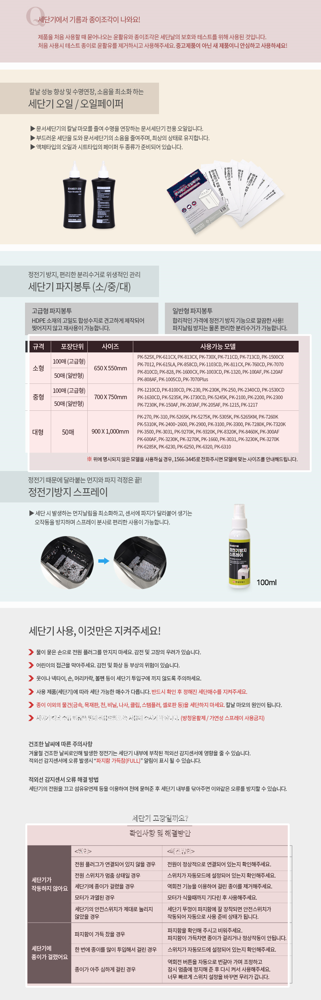

In [81]:
canvas = np.zeros((img_basic.shape[0],img_basic.shape[1], 3), dtype = "uint8")
canvas = ~canvas
for i in range(0,box.shape[0]):
  cv2.rectangle(canvas,(int(boxes[i,0]),int(cut[0,original_num[img_num-1]]+boxes[i,1])),(int(boxes[i,2]),int(cut[0,original_num[img_num-1]]+boxes[i,3])),(235,235,255),-1)
image_final = image_final+canvas

for i in range(0,box.shape[0]):
  cv2.rectangle(image_final,(int(boxes[i,0]),int(cut[0,original_num[img_num-1]]+boxes[i,1])),(int(boxes[i,2]),int(cut[0,original_num[img_num-1]]+boxes[i,3])),(255,255,255),3)
cv2_imshow(image_final)

**인공지능모델만 사용했을 경우(전처리 하지않았을 경우) 후처리**

---



In [82]:
testimage = cv2.imread('testimage.png', cv2.IMREAD_COLOR)		#이미지

image_final = testimage.copy()
img_num = 1

box_write = ([[   6.0615, 2817.5674,  958.9161, 3324.5549]])		#좌표
box = np.array(box_write)
boxes = box
img_num = 1

canvas = np.zeros((testimage.shape[0],testimage.shape[1], 3), dtype = "uint8")

In [ ]:
#색칠
red = (235, 235, 255)
blue = (255, 235, 235)
green = (235, 255, 235)
for i in range(0,box.shape[0]):
  cv2.rectangle(canvas,(int(boxes[i,0]),int(boxes[i,1])),(int(boxes[i,2]),int(boxes[i,3])),red,-1)
image_final = image_final+canvas

In [ ]:
#테두리
red = (0, 0, 255)
blue = (255, 0, 0)
green = (0, 255, 0)
white = (255, 255, 255)
for i in range(0,box.shape[0]):
  cv2.rectangle(image_final,(int(boxes[i,0]),int(boxes[i,1])),(int(boxes[i,2]),int(boxes[i,3])),red,3)
cv2_imshow(image_final)